# Introducción dramática

El día 8 de julio de 2022 muchos maintainers de paquetes de PyPI recibieron un email similar al siguiente:

```
From: noreply@pypi.org
Subject: [PyPI] A project you maintain has been designated as critical

Congratulations! A project you ('crossnox') maintain has been designated as a critical project on PyPI. You can see which project(s) has been designated at http://pypi.org/manage/projects/. .

As part of this effort, in the coming months maintainers of projects designated as critical, like yourself, will be required to enable two-factor authentication on their account in order to add new releases or otherwise modify a critical project.

Since you already have two-factor authentication enabled on your account, there's nothing you need to do at this time.

PS: To make it easier for maintainers like you to enable two-factor authentication, we're also distributing security keys to eligible maintainers. See http://pypi.org/security-key-giveaway/ for more details.
```

A simple vista parece un intento de phishing. En primer instancia, los links no son HTTPS.

Sin embargo, una breve investigación reveló que era real. PyPI estaba marcando el top 1% de paquetes como "Critical" y obligando a sus maintainers a activar 2FA para evitar ataques de cadena de suministro.

En una [sección de preguntas frecuentes](https://pypi.org/security-key-giveaway/), se explicaba como se determina si un proyecto es critico:

> What determines if a project is a critical project?

> PyPI determines eligibility based on download counts derived from PyPI's public dataset of download statistics. Any project in the top 1% of downloads over the prior 6 months is designated as critical.

Lo cual abre el interrogante: es la cantidad de descargas la mejor metrica para definir si un proyecto es _critico_ en el ecosistema?

El objetivo de este trabajo es investigar métricas alternativas, basadas en fuentes adicionales de datos y en el grafo de dependencias entre bibliotecas. Se aplican distintas heurísticas cuyo impacto se discute en las conclusiones finales.

# Qué es un paquete?
Un [paquete](https://docs.python.org/3/glossary.html#term-package) es un [modulo](https://docs.python.org/3/glossary.html#term-module) que puede contener submodulos o, recursivamente, subpaquetes.

Un modulo es un objeto que sirve como una unidad organizacional de codigo python. Tiene un namespace conteniendo objetos arbitrarios de python. Los modulos se cargan en Python al importarlos.

En la documentación del lenguaje se provee [más información](https://docs.python.org/3/tutorial/modules.html) sobre los módulos, y es particularmente relevante leer sobre el sistema de [imports](https://docs.python.org/3/reference/import.html#packages) para entenderlos del todo.

# Bibliotecas
Nos interesa pensar particularmente en los paquetes que son bibliotecas. En particular, vamos a hacer una [distincion entre bibliotecas y aplicaciones](https://caremad.io/posts/2013/07/setup-vs-requirement/), donde conceptualmente vamos a distinguir a las bibliotecas como paquetes desarrollados con la intención de ser usados por terceros de modo reutilizable. Para poder ser reutilizable, tiene que ser distribuido. Y eso es un problema.

## Metadata
Muchos principantes que aprenden python aprenden a especificar las dependencias de su codigo en un pequeño archivito de texto plano llamado `requirements.txt`. Sin embargo, en muchos paquetes vemos un script llamado `setup.py`. Minimamente, se ven asi:

```python
from setuptools import setup

setup(
	name="MyLibrary",
	version="1.0"
    ...
)
```

Volviendo al [articulo de Donald Stufft](https://caremad.io/posts/2013/07/setup-vs-requirement/), algo que queda evidente es la semantica de cada una de las dos opciones:
1. `requirements.txt` es deterministico en el sentido de que dado un cierto conjunto de paquetes disponibles, y la especificacion del nombre del paquete (y opcionalmente un especificador de version), siempre instalará las mismas dependencias.
2. Al ser un script, `setup.py` no garantiza intrinsicamente ser deterministico, permitiendo instalar dependencias condicionales a la plataforma donde se está instalando.

Es evidente que este último formato es mucho más apto para cosas redistribuibles. Lo cual hace [_imposible_ armar el grafo de dependencias](https://dustingram.com/articles/2018/03/05/why-pypi-doesnt-know-dependencies/) a menos que se limiten _severamente_ algunas variables que comunmente se usan para determinar las dependencias a instalar. Por ejemplo:
- Version de python
- Plataforma
    - OS

Y **eso** el formato [wheel](https://peps.python.org/pep-0427/). Y por **eso** es que hay algo de información de dependencias disponible en pypi.

# Información de PyPI
La primer forma de obtener información de pypi sería scrapear todo el sitio, abriendonos a la posibilidad de que nos bloqueen la IP, logrando, efectivamente, un ataque de supply chain (nuestro y de todas las personas en el bloque de la CG-NAT donde nuestros ISPs nos hayan puesto, en su avaricia por ahorrar direcciones IPv4). Esto no es deseable.

El segundo modo es utilizar una fuente de datos pobremente documentada y explicada. Pero legitima.






https://hugovk.github.io/top-pypi-packages/

https://pepy.tech/project/m2r2?display=weekly

https://pypistats.org/packages/m2r2



# Utilidades

In [1]:
import re
from pprint import pprint

import pyarrow.parquet as pq
import rich.tree


def get_schema(f):
    l = f.flatten()
    if len(l) == 1:
        return str(l[0].type)

    return {str(li.name).split(".")[-1]: get_schema(li) for li in l}


def _get_rt(k, v):
    if not isinstance(v, dict):
        _vstr = str(v)
        _vstr = re.sub(r"list\<item: (\w+)\>", r"list<\1>", _vstr)
        # print(k,": " ,str(v), " --> ",_vstr)
        return rich.tree.Tree(f"{k}: {_vstr}")

    t = rich.tree.Tree(k)
    for _k, _v in v.items():
        child = _get_rt(_k, _v)
        t.children.append(child)
        child.parent = t

    return t


def get_rt(d, name):
    root = rich.tree.Tree(name, highlight=False)
    for k, v in d.items():
        child = _get_rt(k, v)
        # print(child, child.label)
        root.children.append(child)
        child.parent = root
    return root


def print_parquet_schema(fname, tname):
    pfile = pq.read_table(fname).schema

    d = {}

    for field in pfile:
        d[field.name] = get_schema(field)

    d = {k: d[k] for k in sorted(d.keys())}

    return get_rt(d, tname)

# Analisis de datos

In [2]:
import pandas as pd

## Proyectos mas descargados

```sql
SELECT 
  file.project as project,
  file.version as version,
  DATE(timestamp) as date,
  COUNT(*) as num_downloads
FROM `bigquery-public-data.pypi.file_downloads`
WHERE
  -- avoid bandersnatch and other mirrors
  details.installer.name = 'pip'
  -- use the oldest alive version
  AND details.python LIKE '3.8.%'
  -- pypy people are weird
  AND details.implementation.name = 'CPython'
  -- Only linux
  AND details.system.name = 'Linux'
  -- Only query the last 30 days of history
  AND DATE(timestamp)
    BETWEEN DATE_SUB(CURRENT_DATE(), INTERVAL 30 DAY)
    AND CURRENT_DATE()
GROUP BY 1, 2, 3
ORDER BY 1 ASC, 2 ASC, 3 ASC
```


In [3]:
most_downloaded = pd.read_parquet("file_downloads__30d__20230204.parquet")

In [4]:
most_downloaded.head()

,project,version,date,num_downloads
0,0,0.0.0,2023-01-06,4
1,0,0.0.0,2023-01-09,4
2,0,0.0.0,2023-01-10,5
3,0,0.0.0,2023-01-11,3
4,0,0.0.0,2023-01-12,1


In [5]:
most_downloaded = (
    most_downloaded.groupby("project").num_downloads.sum().sort_values(ascending=False)
)

In [6]:
top_downloaded = most_downloaded.head(int(len(most_downloaded) * 0.01))

In [7]:
len(top_downloaded)

1552

Pero hay [mas paquetes marcados criticos](https://p.datadoghq.com/sb/7dc8b3250-389f47d638b967dbb8f7edfd4c46acb1?theme=dark&from_ts=1672951994003&to_ts=1675543994003&live=true). Al dia de escribir esto (2023-02-04) hay 4324 paquetes marcados como criticos.

In [8]:
top_downloaded = most_downloaded.head(4324)

In [9]:
top_downloaded.head()

project
boto3              82825736
botocore           78837661
google-api-core    77962554
cryptography       73804490
requests           73227562
Name: num_downloads, dtype: int64

## Proyectos mas consultados

```sql
SELECT 
  project,
  DATE(timestamp) as date,
  COUNT(*) as num_requests
FROM `bigquery-public-data.pypi.simple_requests`
WHERE
  -- avoid bandersnatch and the likes
  details.installer.name = 'pip'
  -- use the oldest alive version
  AND details.python LIKE '3.8%'
  -- pypy people are weird
  AND details.implementation.name = 'CPython'
  -- Only linux
  AND details.system.name = 'Linux'
  -- Only query the last 30 days of history
  AND DATE(timestamp)
    BETWEEN DATE_SUB(CURRENT_DATE(), INTERVAL 30 DAY)
    AND CURRENT_DATE()
GROUP BY 1, 2
ORDER BY 1 ASC, 2 ASC
```

In [10]:
most_requested = pd.read_parquet("simple_requests__30d__20230204.parquet")

In [11]:
most_requested = (
    most_requested.groupby("project").num_requests.sum().sort_values(ascending=False)
)

In [12]:
top_requested = most_requested.head(4324)

In [13]:
top_requested.head()

project
pip             485823010
requests        200246682
oauthlib        169602357
setuptools      168930870
cryptography    156799618
Name: num_requests, dtype: int64

## Son la misma métrica?
Para contestar a esta pregunta, vamos a ver utilizar el coeficiente [Kendall Tau](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kendalltau.html) como medida de correlación entre los rankings de descargas y consultas.

In [14]:
libmetrics = pd.merge(
    most_downloaded, most_requested, left_index=True, right_index=True, how="outer"
)

In [15]:
libmetrics["downloads_ranking"] = libmetrics.num_downloads.rank(
    ascending=False, na_option="keep",
)

In [16]:
libmetrics["requests_ranking"] = libmetrics.num_requests.rank(
    ascending=False, na_option="keep",
)

In [17]:
from scipy.stats import kendalltau

In [18]:
kendalltau(libmetrics.downloads_ranking, libmetrics.requests_ranking, nan_policy="omit")

SignificanceResult(statistic=0.8821265353536297, pvalue=0.0)

Y si bien tienen una alta correlación, no son _exactamente_ iguales. Veamos.

## Diferencias del top 100

In [19]:
import numpy as np
from IPython.display import Markdown, display

In [20]:
def format_delta(x):
    if x > 0:
        return f"▲ {int(x):d}"
    elif x < 0:
        return f"▼ {int(abs(x)):d}"
    else:
        return f"●"


libmetrics["change"] = libmetrics.downloads_ranking - libmetrics.requests_ranking


def style_negative(v, neg="", pos=""):
    if v > 0:
        return pos
    elif v < 0:
        return neg
    else:
        return ""


libmetrics.sort_values("downloads_ranking").head(100).style.format(
    {"change": format_delta}, precision=0
).applymap(
    style_negative,
    neg="background-color:#a60101",
    pos="background-color:#045206",
    subset=["change"],
)

,num_downloads,num_requests,downloads_ranking,requests_ranking,change
project,,,,,
boto3,82825736,111110456,1,16,▼ 15
botocore,78837661,142570730,2,9,▼ 7
google-api-core,77962554,46745668,3,91,▼ 88
cryptography,73804490,156799618,4,5,▼ 1
requests,73227562,200246682,5,2,▲ 3
pyyaml,64462570,150845452,6,6,●
typing-extensions,61332239,102356458,7,24,▼ 17
charset-normalizer,57381994,102048423,8,25,▼ 17
urllib3,56414114,150293067,9,7,▲ 2


In [21]:
display(
    Markdown(
        f"""El {(libmetrics.sort_values("downloads_ranking").head(100).requests_ranking <= 100).mean():.2%} de los paquetes mas descargados dentro del top 100 no son los mas consultados.

La caída promedio es de {libmetrics.sort_values("downloads_ranking").head(100).change.mean()} posiciones."""
    )
)

El 54.00% de los paquetes mas descargados dentro del top 100 no son los mas consultados.

La caída promedio es de -54.19 posiciones.

## Paquetes mas descargados que pedidos

Es una circunstancia que debería darse poco. Veamos cuantas bibliotecas caen en esta categoria.

In [22]:
(libmetrics.num_downloads > libmetrics.num_requests).sum()

3957

In [23]:
libmetrics[(libmetrics.num_downloads > libmetrics.num_requests)].sort_values(
    "downloads_ranking"
).head(25)

,num_downloads,num_requests,downloads_ranking,requests_ranking,change
project,,,,,
google-api-core,77962554.0,46745668.0,3.0,91.0,-88.0
cfn-lint,20630824.0,1152568.0,48.0,1043.0,-995.0
google-cloud-bigquery,20246170.0,11563134.0,52.0,251.0,-199.0
grpcio-status,15493572.0,13603532.0,73.0,227.0,-154.0
aiobotocore,13639815.0,5717551.0,89.0,391.0,-302.0
s3fs,12845298.0,7547873.0,95.0,320.0,-225.0
coverage,12720355.0,10796490.0,96.0,261.0,-165.0
nbconvert,9175822.0,5825404.0,135.0,383.0,-248.0
tensorflow-serving-api,8649142.0,908285.0,147.0,1161.0,-1014.0


Es interesante que muchas de estas librerias estan relacionadas a entornos cloud.

## Metadata

```sql
select 
  name,
  version,
  platform,
  requires_python,
  requires,
  provides,
  obsoletes,
  requires_dist,
  provides_dist,
  obsoletes_dist,
  requires_external,
  upload_time,
  filename,
  python_version
from `bigquery-public-data.pypi.distribution_metadata`
;
```

In [24]:
metadata = pd.read_parquet("metadata__20230204.parquet")

In [25]:
metadata = metadata.sort_values("upload_time", ascending=False)

In [26]:
rich.print(
    print_parquet_schema(
        "metadata__20230204.parquet", "bigquery-public-data.pypi.distribution_metadata"
    )
)

bigquery-public-data.pypi.distribution_metadata
├── filename: string
├── name: string
├── obsoletes: list<string>
├── obsoletes_dist: list<null>
├── platform: list<string>
├── provides: list<string>
├── provides_dist: list<null>
├── python_version: string
├── requires: list<string>
├── requires_dist: list<string>
├── requires_external: list<string>
├── requires_python: string
├── upload_time: timestamp
└── version: string

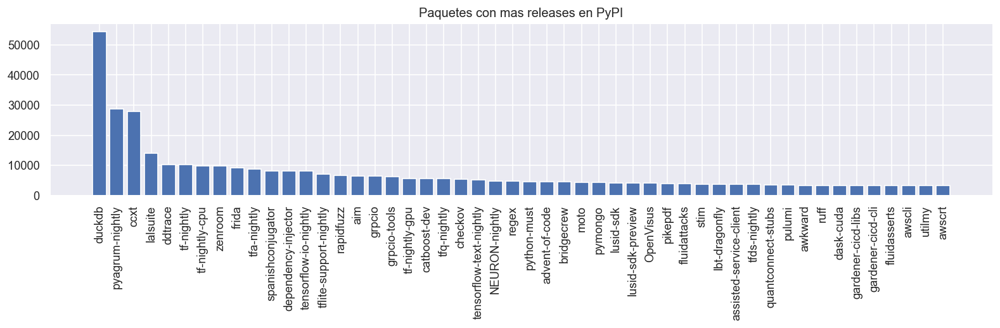

In [27]:
import seaborn as sns
from matplotlib import pyplot as plt

sns.set()

plt.figure(figsize=(16, 3), dpi=120)
packages = metadata.name.value_counts().head(50)
plt.bar(packages.index, packages.values)
plt.title("Paquetes con mas releases en PyPI")
plt.xticks(rotation=90)
plt.show()

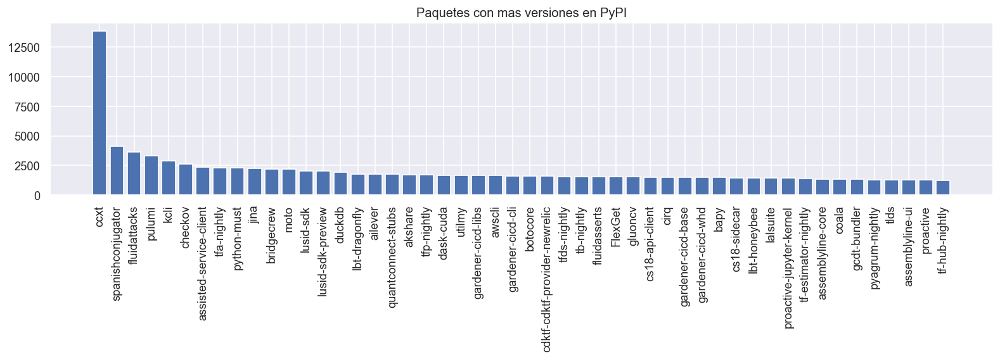

In [28]:
plt.figure(figsize=(16, 3), dpi=120)
packages = (
    metadata.groupby("name").version.nunique().sort_values(ascending=False).head(50)
)
plt.bar(packages.index, packages.values)
plt.title("Paquetes con mas versiones en PyPI")
plt.xticks(rotation=90)
plt.show()

### Filtrar releases

Considerar que nuestros datos de descarga son de:
- Linux
- CPython3.8.x
- pip

#### CPython 3.8

Siguiendo [PEP 425 - Python Tag](https://peps.python.org/pep-0425/#python-tag).

##### Filtrar por `requires_python`

In [29]:
display(f"Faltantes: {metadata.requires_python.isna().mean():.2%}")

'Faltantes: 55.09%'

In [30]:
import logging
from functools import lru_cache

from packaging.requirements import InvalidRequirement, Requirement
from packaging.version import Version
from pandarallel import pandarallel
from tqdm.notebook import tqdm

pandarallel.initialize(nb_workers=8, progress_bar=True)
tqdm.pandas()


logger = logging.getLogger("pypidata")
logger.setLevel(logging.INFO)


@lru_cache(maxsize=5000)
def parse_pyreq(s):
    if s[-1] == ",":
        s = s[:-1]
    if s.startswith("=2"):
        s = f"={s}"
    if s.startswith("2"):
        s = f"=={s}"
    if s.startswith("3"):
        s = f"=={s}"
    if " " in s:
        s = s.replace(" ", "")

    s = s.replace("~3", "~=3").replace("~2", "~=2")

    s = s.replace("\n", ",")

    while ",," in s:
        s = s.replace(",,", ",")

    s = f"python{s}"

    try:
        return "3.8" in Requirement(s).specifier
    except InvalidRequirement as e:
        logger.error(f"At {repr(s)} {s} {',,' in s}", exc_info=True)


metadata.loc[metadata.requires_python.notna(), "requires_python"] = metadata[
    metadata.requires_python.notna()
].requires_python.progress_apply(parse_pyreq)

metadata = metadata[metadata.requires_python.isna() | metadata.requires_python]

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


  0%|          | 0/3834147 [00:00<?, ?it/s]

In [31]:
for i in ["py3", "py2.py3", "cp38", "3.8", "any"]:
    assert (metadata.python_version == i).any(), i

##### Filtrar por `python_version`

In [32]:
display(f"Faltantes: {metadata.python_version.isna().mean():.2%}")

'Faltantes: 0.00%'

In [33]:
metadata = metadata[
    ~metadata.name.str.lower().str.contains("topsis")
]  # Funny story here, clearly an assignment

Can i delete source ones?

In [34]:
source_releases = (
    metadata[(metadata.python_version == "source")]
    .drop_duplicates(subset=["version", "name"])[["version", "name"]]
    .assign(has_source=True)
)
non_source_releases = (
    metadata[metadata.python_version != "source"]
    .drop_duplicates(subset=["version", "name"])[["version", "name"]]
    .assign(has_nonsource=True)
)

has_both = pd.merge(
    left=source_releases,
    right=non_source_releases,
    how="outer",
    on=["version", "name"],
    suffixes=("_source", "_non_source"),
)

has_both.fillna(False, inplace=True)

pd.pivot_table(
    has_both,
    columns="has_source",
    index="has_nonsource",
    values="name",
    aggfunc="count",
    fill_value=0,
)

has_source,False,True
has_nonsource,,
False,0,1397461
True,491544,2450313


Yep.

In [35]:
# Sacar outliers
top_python_versions = metadata.python_version.value_counts()
top_python_versions = top_python_versions[
    (top_python_versions.cumsum() / top_python_versions.sum()) <= 0.995
].index.tolist()

In [36]:
orig_size = len(metadata)

metadata = metadata[
    (metadata.python_version.isin(top_python_versions))
    & ~(metadata.python_version.str.contains("pypy"))
    & ~(metadata.python_version.str.contains("cpcp"))
    & (
        (metadata.python_version.str.contains("^3\.8"))
        | (metadata.python_version.str.contains("(cp38|py38|cp3\.8|py3\.8)"))
        | (metadata.python_version.str.contains("py3(?![123456790])"))
        | (metadata.python_version.isin(["any",]))
    )
]

final_size = len(metadata)

print(f"Mantiene: {final_size / orig_size:.2%} de las filas")

/tmp/ipykernel_3723397/1254240050.py:9: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  | (metadata.python_version.str.contains("(cp38|py38|cp3\.8|py3\.8)"))


Mantiene: 35.43% de las filas


In [37]:
for i in ["py3", "py2.py3", "cp38", "3.8", "any"]:
    assert (metadata.python_version == i).any(), i

##### Filtrar por `filename` segun [PEP 427](https://peps.python.org/pep-0427/#file-name-convention)

In [38]:
from packaging.utils import InvalidVersion, InvalidWheelFilename, parse_wheel_filename


def coalesce_parse_whl(w):
    try:
        name, version, build_number, tags = parse_wheel_filename(w)
        return name, version, build_number, tags
    except (InvalidWheelFilename, InvalidVersion):
        return None


metadata.head(100).filename.progress_apply(coalesce_parse_whl).iloc[50]

  0%|          | 0/100 [00:00<?, ?it/s]

('nbdev-stdlib',
 <Version('0.0.594')>,
 (),
 frozenset({<py3-none-any @ 140322473417600>}))

#### Linux

In [39]:
import operator as ops

In [40]:
has_platform = metadata.platform.apply(len) > 0

metadata.loc[has_platform, "platform"] = metadata[has_platform].platform.apply(
    ops.itemgetter(0)
)
metadata.loc[~has_platform, "platform"] = None

In [41]:
metadata.platform = metadata.platform.str.lower()

In [42]:
metadata.loc[
    metadata.platform.notna() & metadata.platform.str.contains("linux"), "platform"
] = "linux"
metadata.loc[
    metadata.platform.notna() & metadata.platform.str.contains("posix"), "platform"
] = "linux"
metadata.loc[
    metadata.platform.notna() & metadata.platform.str.contains("ubuntu"), "platform"
] = "linux"

top_platforms = metadata.drop_duplicates(
    subset=["name", "platform"]
).platform.value_counts()
top_platforms = top_platforms[top_platforms > 1].index.tolist()
len(top_platforms)

119

In [43]:
metadata = metadata[
    (metadata.platform.isna())
    | (
        (metadata.platform.isin(top_platforms))
        & (~metadata[metadata.platform.notna()].platform.str.contains("^mac"))
        & (
            ~metadata[metadata.platform.notna()].platform.isin(
                [
                    # insertar comentario cinico/sarcastico sobre estas opciones
                    "windows",
                    "win32",
                    "darwin",
                    "windows10",
                    "android",
                    "win32_amd64",
                    "operating system :: microsoft :: windows :: windows 10",
                    "win_amd64",
                    "operating system :: macos :: macos x",
                    "operating system :: microsoft :: windows",
                    "nt",
                    "osx",
                    "window10",
                    "win-amd64",
                    "windows only",
                    "win64",
                    "windows,",
                    "win",
                    "window",
                    "darwin-21.4.0-x86_64-i386-64bit",
                    "wind",
                    "win_x86_64",
                    "cel",
                    "a",
                    "windows 7",
                    "msvcp_dll_names:msvcp140.dll,msvcp140_1.dll",
                    "cygwin",
                    "win10",
                    "os independent (written in an interpreted language)",
                    "windows 10 x64",
                    "windows xp/2000/nt",
                    "windows 10",
                    "os x",
                    "ms windows",
                ]
            )
        )
    )
]

/tmp/ipykernel_3723397/2015806324.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  metadata = metadata[


In [44]:
metadata = metadata[~metadata.filename.str.endswith(".exe")]

In [45]:
metadata = metadata[~metadata.filename.str.endswith(".rpm")]

In [46]:
metadata = metadata[~metadata.filename.str.contains("macos")]

In [47]:
metadata = metadata[
    ~(
        metadata.filename.str.contains("win32.")
        | metadata.filename.str.contains("win_amd64.")
        | metadata.filename.str.contains("win-amd64.")
    )
]

#### Data on `requires_dist`

In [48]:
# metadata = metadata[metadata.requires_dist.apply(len) > 0]

In [49]:
display(
    f"A esta altura nos quedan {len(metadata)} releases de {metadata.name.nunique()} paquetes"
)

'A esta altura nos quedan 2742303 releases de 275971 paquetes'

### Parse `requires_dist`

In [50]:
metadata["requires_dist_l"] = metadata.requires_dist.apply(lambda x: x.size)

In [51]:
metadata = metadata.sort_values(by=["name", "requires_dist_l"], ascending=False)

In [52]:
import re


def fix_pyver(l):
    if not any("python_version" in y for y in l):
        return l

    return [
        re.sub(
            r"(?P<PRELUDE>.*)python_version == (?P<MAJOR>\d)(?P<MINOR>\.\d)?(?P<PATCH>\.\d)?",
            "\g<PRELUDE>python_version == '\g<MAJOR>\g<MINOR>\g<PATCH>'",
            x,
        )
        for x in l
    ]


metadata.requires_dist = metadata.requires_dist.progress_apply(fix_pyver)

  0%|          | 0/2742303 [00:01<?, ?it/s]

In [53]:
@lru_cache(maxsize=512_000)
def parse_req(x):
    if x[-1] == ")":
        try:
            return Requirement(x)
        except:
            x = x.replace(" (", "").replace(")", "").replace(";", "")
            return Requirement(x)

    return Requirement(x)


@lru_cache(maxsize=32_000)
def parse_list(l):
    try:
        return [parse_req(r) for r in l]
    except InvalidRequirement:
        print(l)
        raise

In [54]:
metadata.requires_dist = metadata.requires_dist.progress_apply(tuple).progress_apply(
    parse_list
)

  0%|          | 0/2742303 [00:00<?, ?it/s]

  0%|          | 0/2742303 [00:00<?, ?it/s]

In [55]:
def valid_version(v):
    try:
        Version(v)
        return True
    except:
        return False


print(
    f"{metadata.version.progress_apply(valid_version).mean():.2%} con versiones validas"
)

metadata.version = metadata.version.progress_apply(valid_version)

  0%|          | 0/2742303 [00:00<?, ?it/s]

100.00% con versiones validas


  0%|          | 0/2742303 [00:00<?, ?it/s]

In [56]:
metadata.head()

,name,version,platform,requires_python,requires,provides,obsoletes,requires_dist,provides_dist,obsoletes_dist,requires_external,upload_time,filename,python_version,requires_dist_l
5355149,zzzzzTest2000,True,None,True,[],[],[],[],[],[],[],2022-08-23 19:43:40.862210+00:00,zzzzztest2000-1.24.58-py3-none-any.whl,py3,0
5528628,zzzzzTest2,True,None,True,[],[],[],[],[],[],[],2022-08-23 19:10:46.852963+00:00,zzzzztest2-1.24.58-py3-none-any.whl,py3,0
3324918,zzzzls-Spider,True,any,None,[],[],[],"[tqdm, requests, HeroSpider]",[],[],[],2020-11-19 06:44:51.376565+00:00,zzzzls_Spider-1.2.5-py3-none-any.whl,py3,3
1342228,zzzzls-Spider,True,any,None,[],[],[],"[tqdm, requests]",[],[],[],2020-11-19 07:09:13.308594+00:00,zzzzls_Spider-1.2.6-py3-none-any.whl,py3,2
1802452,zzzz,True,None,None,[],[],[],[],[],[],[],2020-04-01 10:13:32.478193+00:00,zzzz-0.0.3-py3-none-any.whl,py3,0


# Construir el grafo

Habiendo limpiado la data lo más posible vamos a construir el grafo de dependencia entre paquetes. Para ello, se utiliza `networkx` inicialmente.
Por el tamaño del grafo, y limitaciones de la biblioteca, luego se utiliza `cugraph`.

## Grafo dirigido de biblioteca a biblioteca
En este punto, se genera un grafo dirigido pesado entre bibliotecas. Hay una arista $e_{ij}$ que une los vertices $v_i \to v_j$ si $i$ lista a $j$ entre sus dependencias.

No hay ninguna noción de peso asociada.

In [57]:
from packaging.utils import canonicalize_name

In [58]:
import networkx as nx

In [59]:
top_1p_downloads = set(
    [
        canonicalize_name(w)
        for w in most_downloaded.head(int(len(most_downloaded) * 0.01)).index.tolist()
    ]
)
top_1p_requested = set(
    [
        canonicalize_name(w)
        for w in most_requested.head(int(len(most_requested) * 0.01)).index.tolist()
    ]
)

In [60]:
G = nx.DiGraph()

In [61]:
for x in metadata.name.unique():
    x = canonicalize_name(x)
    G.add_node(
        x,
        from_metadata=True,
        top_1p_downloads=x in top_1p_downloads,
        top_1p_requested=x in top_1p_requested,
    )

In [62]:
for lib, reqs in tqdm(metadata[["name", "requires_dist"]].to_records(index=False)):
    lib = canonicalize_name(lib)
    for req in reqs:
        req_name = canonicalize_name(req.name)
        if not G.has_node(req_name):
            G.add_node(req_name, from_metadata=False)
        G.add_edge(lib, req_name, version=req.specifier)

  0%|          | 0/2742303 [00:00<?, ?it/s]

In [63]:
isolated_nodes = set(n for n, deg in G.out_degree if deg == 0) & set(
    n for n, deg in G.in_degree if deg == 0
)
print(len(isolated_nodes))

75723


In [64]:
G.number_of_nodes()

286483

In [65]:
G.remove_nodes_from(isolated_nodes)

In [66]:
G.number_of_nodes()

210760

In [67]:
G.number_of_edges()

1125022

### Centralidad como medida de importancia
En el escenario que nos concierne, estamos tratando de resolver el problema de marcar los paquetes criticos del ecosistema como tales para evitar problemas de supply chain. Esto puede tomar muchas formas, desde envenenamiento del paquete hasta su remoción absoluta. ¿Que pasaría si un día `pandas` desapareciera de PyPI?

Anteriormente se discutió que la cantidad de requests al índice sobre cada paquete es, intuitivamente, mejor métrica para denominar a un paquete crítico. Una segunda idea es que la centralidad es una métrica superadora. En particular, la `closeness centrality` nos indica que tan cercano es un paquete a todos los demás, por ende, el impacto que tiene en el ecosistema.

In [68]:
import cugraph
import cupy
from scipy.stats import kendalltau
from sklearn.preprocessing import LabelEncoder

import cudf

In [69]:
# Mas lento que nx
def cugraph_closeness_centrality(G):
    le = LabelEncoder()
    _ = le.fit(list(G.nodes))

    edges_df = nx.to_pandas_edgelist(G)
    edges_df["source_id"] = le.transform(edges_df.source)
    edges_df["target_id"] = le.transform(edges_df.target)
    edges_df.drop(columns=["version"]).to_parquet("edges_df.parquet", index=False)

    # create a reversed graph view
    cuG = cugraph.from_pandas_edgelist(
        edges_df[["source_id", "target_id"]],
        source="target_id",
        destination="source_id",
        create_using=cugraph.DiGraph,
        renumber=False,
    )

    len_G = cuG.number_of_nodes()
    wf_improved = True
    nodes = cuG.nodes()

    closeness_arr = cupy.ndarray(shape=len_G, dtype=np.float64)

    for n in tqdm(nodes.values_host):
        sp = cugraph.sssp(cuG, source=n)
        mask = sp.predecessor != -1
        sp = sp[mask]
        totsp = sp.distance.sum()
        _closeness_centrality = 0.0
        if totsp > 0.0 and len_G > 1:
            _closeness_centrality = mask.sum() / totsp
            # normalize to number of nodes-1 in connected part
            if wf_improved:
                s = mask.sum() / (len_G - 1)
                _closeness_centrality *= s

        closeness_arr[n] = _closeness_centrality

    closeness_dict = dict(zip(le.inverse_transform(np.arange(len_G)), closeness_arr))

    return closeness_dict

In [70]:
# fast
# nx.centrality.eigenvector_centrality_numpy(G)

In [71]:
%%time


def closeness_centrality2(G, wf_improved=True):
    # adapted from
    # https://networkx.org/documentation/stable/_modules/networkx/algorithms/centrality/closeness.html#closeness_centrality
    if G.is_directed():
        G = G.reverse()  # create a reversed graph view

    path_length = nx.single_source_shortest_path_length

    nodes = G.nodes

    closeness_dict = {}
    for n in tqdm(nodes):
        sp = path_length(G, n)
        totsp = sum(sp.values())
        len_G = len(G)
        _closeness_centrality = 0.0
        if totsp > 0.0 and len_G > 1:
            _closeness_centrality = (len(sp) - 1.0) / totsp
            # normalize to number of nodes-1 in connected part
            if wf_improved:
                s = (len(sp) - 1.0) / (len_G - 1)
                _closeness_centrality *= s
        closeness_dict[n] = _closeness_centrality

    return closeness_dict


closeness_dict2 = closeness_centrality2(G)

  0%|          | 0/210760 [00:00<?, ?it/s]

CPU times: user 15min 33s, sys: 2.3 s, total: 15min 35s
Wall time: 15min 40s


In [72]:
centrality_df = (
    pd.Series(closeness_dict2.values(), index=closeness_dict2.keys())
    .sort_values(ascending=False)
    .to_frame(name="closeness_centrality")
)
centrality_df["closeness_centrality_rank"] = centrality_df.closeness_centrality.rank(
    ascending=False
).astype(int)

In [73]:
measures_df = libmetrics.merge(
    centrality_df, how="outer", left_index=True, right_index=True
)
measures_df["downloads_critical"] = measures_df.downloads_ranking <= 4324
measures_df["requests_critical"] = measures_df.requests_ranking <= 4324

#### Relacion con descargas

In [74]:
kendalltau(
    measures_df.closeness_centrality_rank,
    measures_df.downloads_ranking,
    nan_policy="omit",
)

SignificanceResult(statistic=0.4369564256332471, pvalue=0.0)

Si bien la correlación es positiva, es bastante baja.

#### Relacion con requests

In [75]:
kendalltau(
    measures_df.closeness_centrality_rank,
    measures_df.requests_ranking,
    nan_policy="omit",
)

SignificanceResult(statistic=0.42765735282130796, pvalue=0.0)

Igualmente que en el caso anterior, es una correlacion, si bien positiva, baja.

#### Proporcion marcada como critica 

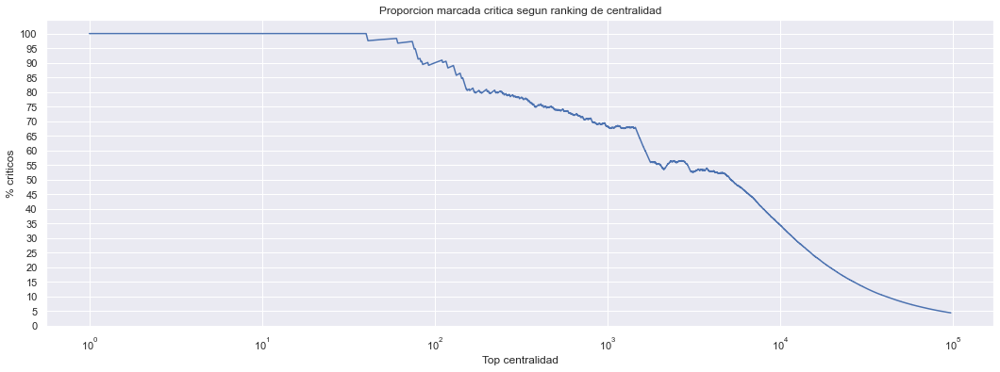

In [76]:
_nnm_df = measures_df.sort_values("closeness_centrality_rank", ascending=True).dropna(
    subset=["closeness_centrality_rank", "downloads_ranking"]
)
x = np.arange(1, len(_nnm_df) + 1)
y = 100 * _nnm_df.downloads_critical.cumsum() / x

plt.figure(figsize=(18, 6))
plt.title("Proporcion marcada critica segun ranking de centralidad")
plt.ylabel("% criticos")
plt.xlabel("Top centralidad")
plt.plot(x, y)
plt.xscale("log")
plt.yticks(ticks=np.linspace(0, 100, num=21, dtype=int))
plt.show()

Es decir, muchas bibliotecas altamente centrales no serían marcadas como críticas si nos guiamos por la cantidad de descargas.  

Esto parece evidencia suficiente para indicar que el criterio elegido podría ser complementado por esta métrica.

Veamos algunos ejemplos de bibliotecas en el top 100 de mayor centralidad que no hayan sido marcadas como criticas segun descargas.

In [77]:
top100 = measures_df.sort_values("closeness_centrality_rank", ascending=True).head(100)
top100[~top100.downloads_critical].sort_values("num_downloads", ascending=False).head(
    25
)

,num_downloads,num_requests,downloads_ranking,requests_ranking,change,closeness_centrality,closeness_centrality_rank,downloads_critical,requests_critical
pytest-black,21812.0,28006.0,4614.0,5623.0,-1009.0,0.218183,79.0,False,False
sphinx-inline-tabs,7869.0,9713.0,7023.0,8479.0,-1456.0,0.216632,84.0,False,False
win-inet-pton,5153.0,23742.0,8190.0,6002.0,2188.0,0.225889,61.0,False,False
docutils-stubs,2297.0,2509.0,11176.5,13840.5,-2664.0,0.214073,93.0,False,False
sphinx-lint,688.0,1276.0,17237.5,17557.5,-320.0,0.233875,41.0,False,False
pytest-checkdocs,308.0,310.0,22675.5,27713.0,-5037.5,0.218252,78.0,False,False
pytest-enabler,286.0,286.0,23212.0,28382.0,-5170.0,0.217931,80.0,False,False
rst-linker,32.0,150.0,43492.0,33989.0,9503.0,0.218332,75.0,False,False
jaraco-packaging,18.0,127.0,50489.5,35572.5,14917.0,0.218332,75.0,False,False
jaraco-test,13.0,14.0,54547.5,64222.0,-9674.5,0.216094,86.0,False,False


### Comunidades en el grafo

Si bien con la centralidad tenemos una mirada holistica del ecosistema completo de python, es razonable pensar que un lenguaje de proposito general tenga comunidades en base a su uso. Por ejemplo:
- Para scripting web: `requests`
- Para aplicaciones web
    - El ecosistema `fastapi`
    - El ecosistema `django`
    - El ecosistema `flask`
- Para machine learning
    - El stack de analisis de datos basado en `pandas`
    - ML tradicional con `scikit-learn`
    - Las bibliotecas construidas alrededor de `torch`
    - Las bibliotecas construidas alrededor de `tensorflow`
    
Vamos a hacer un analisis de comunidades, con el objetivo de entender si las bibliotecas mas importantes (medida por centralidad) dentro de la comunidad estan marcadas como criticas.

In [78]:
#%%time
# communities = nx.community.louvain_communities(G, resolution=1, seed=117, threshold=1e-2)

La implementación de `networkx` del algoritmo de detección de comunidades de Louvain es _extremadamente_ lenta. Luego de más de una hora la ejecución no había terminado.  
Por ello se decidió acelarar por GPU el calculo de comunidades. Esta sección del notebook solo se puede correr con una instalación de CUDA/ROCm de [RAPIDS](https://rapids.ai/index.html).  
Un tradeoff asociado es que la implementación actual (v22.12.00) de `cugraph` [solo soporta grafos no dirigidos](https://docs.rapids.ai/api/cugraph/stable/api_docs/api/cugraph.dask.community.louvain.louvain.html#cugraph.dask.community.louvain.louvain).

In [79]:
edges_df = nx.to_pandas_edgelist(G)

cuG = cugraph.from_pandas_edgelist(
    edges_df[["source", "target"]],
    source="source",
    destination="target",
    create_using=cugraph.Graph,
    renumber=True,
)

In [80]:
%%time
parts, mod_score = cugraph.louvain(cuG, max_iter=500, resolution=0.85,)

print(f"Modularity was {mod_score}. Over {parts.partition.nunique()} partitions")

Modularity was 0.5141443610191345. Over 957 partitions
CPU times: user 228 ms, sys: 184 ms, total: 412 ms
Wall time: 412 ms


In [81]:
parts_df = measures_df.merge(
    parts.to_pandas().set_index("vertex"), left_index=True, right_index=True
)

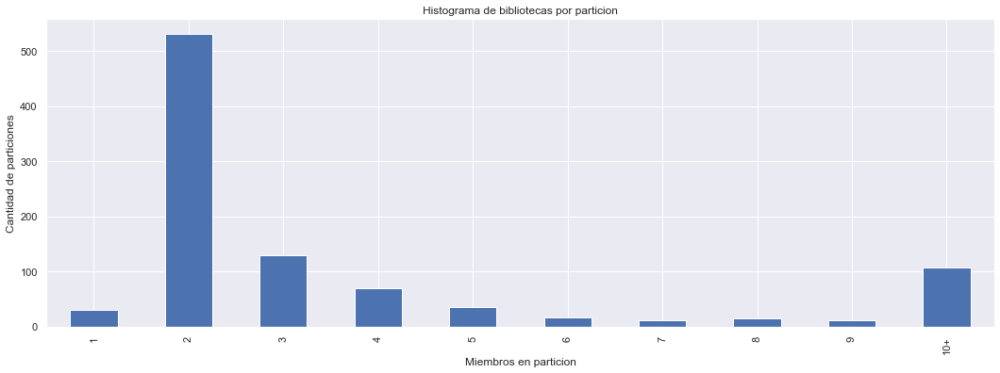

In [82]:
plt.figure(figsize=(18, 6))
cts = (
    parts_df.reset_index()
    .rename(columns={"index": "name"})
    .groupby("partition")
    .name.count()
)
cts_labels = cts.copy()
cts_labels[cts_labels >= 10] = 10

cts_labels.value_counts().sort_index().plot(kind="bar")
plt.ylabel("Cantidad de particiones")
plt.xlabel("Miembros en particion")
plt.title("Histograma de bibliotecas por particion")
plt.xticks(ticks=range(0, 10), labels=[*range(1, 10), f"10+"])
plt.show()

Voy a dejar de lado las particiones con solo 1 o 2 miembros, bajo la nocion de que no deben ser particularmente importantes.

In [83]:
parts_df = parts_df.merge(
    cts.rename("partition_elements"), left_on="partition", right_index=True, how="inner"
)

In [84]:
parts_df["ranking_within_partition"] = (
    parts_df[parts_df.partition_elements > 2]
    .groupby("partition")
    .closeness_centrality.rank(method="dense", ascending=False)
)

In [85]:
parts_df["top_1p_within_partition"] = (
    parts_df[parts_df.partition_elements > 2].ranking_within_partition
    <= parts_df[parts_df.partition_elements > 2].partition_elements * 0.01
)

In [86]:
parts_df.head()

,num_downloads,num_requests,downloads_ranking,requests_ranking,change,closeness_centrality,closeness_centrality_rank,downloads_critical,requests_critical,partition,partition_elements,ranking_within_partition,top_1p_within_partition
0,82.0,101.0,33405.0,37833.5,-4428.5,0.000005,49064.0,False,False,3,36961,811.0,False
0-0,NaN,7.0,NaN,76737.0,NaN,0.000005,49064.0,False,False,3,36961,811.0,False
0-0-1,6.0,6.0,66319.5,80018.0,-13698.5,0.000005,49064.0,False,False,3,36961,811.0,False
0-0-21,NaN,NaN,NaN,NaN,NaN,0.000005,49064.0,False,False,3,36961,811.0,False
0-8,NaN,NaN,NaN,NaN,NaN,0.000005,49064.0,False,False,3,36961,811.0,False


In [87]:
print(
    f"El {parts_df[(parts_df.partition_elements > 2) & (parts_df.top_1p_within_partition)].downloads_critical.mean():.4%} de las bibliotecas en el top 1% de sus respectivas comunidades estaría marcada como crítica en base a las descargas"
)

El 58.8772% de las bibliotecas en el top 1% de sus respectivas comunidades estaría marcada como crítica en base a las descargas


In [88]:
partition_names = parts_df[parts_df.ranking_within_partition == 1].partition.to_dict()
partition_names = {v: k for k, v in partition_names.items()}

In [89]:
parts_df["partition_name"] = parts_df.partition.map(partition_names)

In [90]:
parts_df[parts_df.partition_name == "odoo"].sort_values(
    "closeness_centrality", ascending=False
).downloads_critical.mean()

0.00020046106043900973

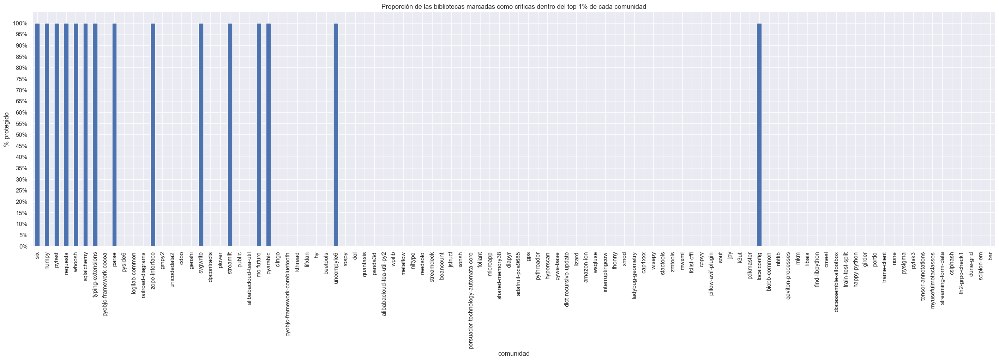

In [91]:
cts2 = cts.copy()
cts2.index = cts2.index.map(partition_names)
order = cts2[cts2 > 2].index

plt.figure(figsize=(32, 8), dpi=110)
parts_df[
    (parts_df.partition_elements > 2) & (parts_df.ranking_within_partition == 1)
].groupby("partition_name").downloads_critical.mean()[order].head(100).plot(kind="bar")
plt.yticks(
    ticks=np.linspace(0, 1, num=21, dtype=float),
    labels=[f"{x:.0%}" for x in np.linspace(0, 1, num=21, dtype=float)],
)
plt.ylabel("% protegido")
plt.xlabel("comunidad")
plt.title(
    "Proporción de las bibliotecas marcadas como criticas dentro del top 1% de cada comunidad"
)
plt.show()

Algo que vemos ahora es que el modo propuesto de marcar bibliotecas como criticas en base a las descargas nada más expone mucho más a algunas comunidades que a otras. Un ejemplo muy claro es la comunidad del CRM y ERM Open Source [Odoo](https://www.odoo.com).

### Graficar comunidades
A modo explorativo, se grafican las bibliotecas dentro del ecosistema de las cuales dependen al menos 10 bibliotecas. Si graficara todo el grafo, en primer lugar no se vería nada por la densidad de puntos. En segundo lugar, Francia. En tercer lugar, no confío en el cooler de mi cpu.

El tamaño indica su centralidad, y el color la comunidad a la que pertenece. Pero habiendo tantas comunidades, es dificil armar un esquema de colores que las diferencie.

In [92]:
degs = cuG.degrees()
degs = degs[degs.in_degree > 10]

small_cuG = cugraph.subgraph(cuG, degs.vertex)

pos = cugraph.force_atlas2(
    small_cuG, max_iter=1000, strong_gravity_mode=True, lin_log_mode=True
)

In [93]:
centrality = cudf.DataFrame(
    {"centrality": centrality_df.closeness_centrality, "vertex": centrality_df.index}
)

In [94]:
pos_df = cudf.merge(parts, pos, left_on="vertex", right_on="vertex")

pos_df = cudf.merge(pos_df, centrality, on="vertex")

pos_df = cudf.merge(pos_df, cuG.degrees(), on="vertex")

pos_df = pos_df.to_pandas()

In [95]:
pos_df["centrality_size"] = np.maximum(pos_df.centrality * 100, 1)
pos_df.centrality_size = pos_df.centrality_size.astype(int)

In [96]:
pos_df = pos_df.sort_values(by="centrality", ascending=False)
pos_df.head()

,partition,vertex,x,y,centrality,in_degree,out_degree,centrality_size
11021,2,pytest,654.899597,-94.274498,0.328450,23263,23263,32
24223,3,requests,-663.675842,694.232117,0.320826,40021,40021,32
32093,0,six,332.288300,241.636368,0.299399,10720,10720,29
6235,2,sphinx,-491.812256,852.550720,0.294859,9338,9338,29
27325,2,pytest-cov,-75.303741,-474.600433,0.278706,10733,10733,27


In [97]:
import plotly.express as px
import plotly.graph_objects as go

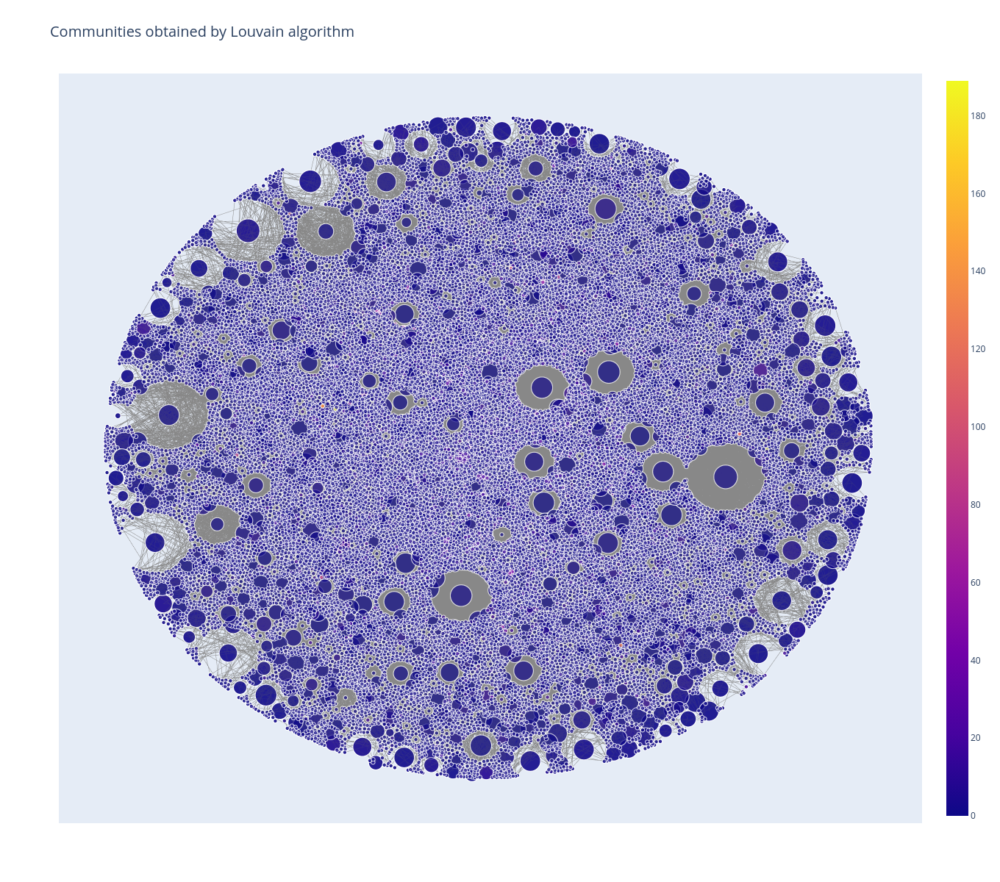

In [98]:
edge_trace = px.scatter(pos_df, x="x", y="y", render_mode="webgl")
edge_trace.update_traces(line=dict(color="#888", width=0.5), mode="lines")

node_trace = px.scatter(
    pos_df,
    x="x",
    y="y",
    size="centrality_size",
    color="partition",
    color_discrete_sequence="g10",
    color_discrete_map="partition",
    hover_name="vertex",
    hover_data=["partition",],
    render_mode="webgl",
    size_max=pos_df.centrality_size.max(),
)


fig = go.Figure(
    data=node_trace.data + edge_trace.data + node_trace.data,
    layout=go.Layout(
        title="Communities obtained by Louvain algorithm",
        titlefont_size=20,
        showlegend=False,
        hovermode="closest",
        # margin=dict(b=20,l=5,r=5,t=40),
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        autosize=False,
        height=1200,
        width=1200,
    ),
)
fig.show()

### Puentes en el grafo

Sería muy raro que haya puentes en el grafo, dado que es mas similar a una red social.

In [99]:
uG = G.to_undirected()

In [100]:
nx.has_bridges(uG)

True

In [101]:
print(f"Hay {sum(1 for _ in nx.bridges(uG))} puentes globales")

Hay 45562 puentes globales


Varios probablemente se deban a componentes conexas muy chicas.

In [102]:
concoms2elems = 0

for concom in nx.connected_components(uG):
    if len(concom) == 2:
        concoms2elems += 1

print(f"De los cuales {concoms2elems} son de componentes conexas de 2 elementos")

De los cuales 531 son de componentes conexas de 2 elementos


### Motifs

En base a la anterior sección anterior, esperaría que haya muchos motifs de cadenas de 3 y 4 elementos. Correr el siguiente codigo es inviable para todo el grafo (dado su tamaño), por lo que se hará solo para una comunidad.

In [103]:
import itertools
from collections import defaultdict


def generate_motifs(n: int = 5):
    if n >= 6:
        warning.warning("You better make some coffee while this runs")

    nonisomorphs = defaultdict(list)

    G0 = nx.Graph()
    G0.add_edge(1, 2)

    nonisomorphs[G0.number_of_nodes()].append(G0)

    for i in range(3, n + 1):
        previous_nonisomorphs = nonisomorphs[i - 1]
        check_isomorphs = defaultdict(list)

        for graph in previous_nonisomorphs:
            possible_edges_list = list(
                itertools.chain.from_iterable(
                    [[*itertools.combinations(graph.nodes(), r)] for r in range(1, i)]
                )
            )
            for new_edges in possible_edges_list:
                H = graph.copy()
                new_edges = list(itertools.product([i], new_edges))
                H.add_edges_from(new_edges)
                possible_isomorphs = check_isomorphs[H.number_of_edges()]
                is_isomorph = any(
                    nx.isomorphism.is_isomorphic(pi, H) for pi in possible_isomorphs
                )
                if not is_isomorph:
                    check_isomorphs[H.number_of_edges()].append(H)
        all_non_isomorph = list(itertools.chain.from_iterable(check_isomorphs.values()))
        nonisomorphs[i].extend(all_non_isomorph)

    return list(itertools.chain.from_iterable(nonisomorphs.values()))

In [104]:
import multiprocessing as mp
import functools
from progressbar import ProgressBar
import sys

In [105]:
SIGNAL = "AHHHHHHHHHHHHHHHHHHHHHHHHHHHHHH"


class PermProducer(mp.Process):
    def __init__(self, H, NM, out_q, consumers=1):
        super().__init__()
        self.H = H
        self.NM = NM
        self.out_q = out_q
        self.consumers = consumers

    def run(self):
        i = 0
        bar = ProgressBar()
        
        for cc in nx.connected_components(self.H):
            for r in range(2, self.NM + 1):
                for comb in itertools.combinations(cc, r):
                    self.out_q.put(comb)
                    i += 1
                    bar.update(i)

        for _ in range(self.consumers):
            print("Prod::Sent SIGNAL")
            self.out_q.put(SIGNAL)


class CombChecker(mp.Process):
    def __init__(self, H, in_q, out_q, motifs, i):
        super().__init__()
        self.H = H
        self.in_q = in_q
        self.out_q = out_q
        self.motifs = motifs
        self.i = i

    def run(self):
        balanced_motifs = defaultdict(list)
        for motif in self.motifs:
            balanced_motifs[(motif.number_of_nodes(), motif.number_of_edges())].append(
                motif
            )
        
        motif_count = {nx.weisfeiler_lehman_graph_hash(motif): 0 for motif in motifs}
        motif_lookup = {nx.weisfeiler_lehman_graph_hash(motif): motif for motif in motifs}
        
        i = 0
        while True:
            sg_nodes = self.in_q.get()
            i += 1
            
            if i % 100_000 == 0:
                print(f"Checker {self.i} :: {i}")
            
            if sg_nodes == SIGNAL:
                print(f"Checker {self.i} got SIGNAL")
                break
        
            sg = self.H.subgraph(sg_nodes)
            
            if not nx.is_connected(sg):
                continue
                
            for possible_motif in balanced_motifs[
                (sg.number_of_nodes(), sg.number_of_edges())
            ]:
                if nx.is_isomorphic(possible_motif, sg):
                    r = nx.weisfeiler_lehman_graph_hash(possible_motif)
                    motif_count[r] += 1
            
        self.out_q.put({
            motif_lookup[motif]:count for motif,count in motif_count.items()
        })

In [134]:
parts_df.partition_name.value_counts().head(30)

numpy                        51410
six                          43211
requests                     36961
pytest                       27248
odoo                          9977
whoosh                        9811
sqlalchemy                    7531
typing-extensions             6563
pyobjc-framework-cocoa        4697
dpcontracts                   1506
parse                         1361
zope-interface                1158
alibabacloud-tea-util          664
alibabacloud-tea-util-py2      622
logilab-common                 542
pyside6                        508
genshi                         481
railroad-diagrams              421
interruptingcow                384
streamlit                      337
gmpy2                          171
public                         157
kthread                        120
svgwrite                       112
plover                          99
unicodedata2                    90
pywe-base                       87
jstruct                         86
ladybug-geometry    

In [107]:
# parts_df.partition_name.value_counts().head(25)

In [108]:
# parts_df[(parts_df.partition_name == "numpy") & (parts_df.num_downloads > 1) & (parts_df.num_requests > 1000)]

In [138]:
streamlit_community = parts_df[(parts_df.partition_name == "streamlit")].index.tolist()# & (parts_df.num_downloads > 10) & (parts_df.num_requests > 10)].index.tolist()

In [139]:
# numpy_community = parts_df[(parts_df.partition_name == "numpy") & (parts_df.num_downloads > 1) & (parts_df.num_requests > 1)].sort_values("num_downloads").index.tolist()

In [143]:
subG = nx.subgraph(uG, streamlit_community)
print(subG.number_of_nodes())
assert nx.is_connected(subG)

337


In [ ]:
%%time

NM = 4

n_checkers = 24
       
motifs = generate_motifs(NM)
    
q_prod = mp.Queue(maxsize=1_000_000)
        
producer = PermProducer(subG, NM, out_q=q_prod, consumers=n_checkers)

q_check = mp.Queue()

checkers = [
    CombChecker(subG, q_prod, q_check, motifs, i)
    for i in range(n_checkers)
]

print("starting")

producer.start()
[c.start() for c in checkers]

print("waiting")

producer.join()

all_results = []

for _ in tqdm(range(n_checkers)):
    all_results.append(r)

_ = [c.join() for c in checkers]

starting


- |                          #                   | 235807 Elapsed Time: 0:00:06

waiting


| |           #                                 | 2799731 Elapsed Time: 0:00:46

Checker 0 :: 100000


| |                                        #    | 2926313 Elapsed Time: 0:00:49

Checker 1 :: 100000


\ |             #                               | 3074229 Elapsed Time: 0:00:52

Checker 2 :: 100000


- |              #                              | 3193112 Elapsed Time: 0:00:55

Checker 3 :: 100000

\ |               #                             | 3199437 Elapsed Time: 0:00:55

- |                       #                     | 3231024 Elapsed Time: 0:00:56

Checker 4 :: 100000


/ |                                   #         | 3283215 Elapsed Time: 0:00:57

Checker 5 :: 100000


| |                                          #  | 3334730 Elapsed Time: 0:00:58

Checker 6 :: 100000


| |                                  #          | 3373254 Elapsed Time: 0:00:59

Checker 7 :: 100000


- |                            #                | 3400768 Elapsed Time: 0:01:00

Checker 8 :: 100000


- |                       #                     | 3417299 Elapsed Time: 0:01:00

Checker 9 :: 100000


\ |                      #                      | 3423710 Elapsed Time: 0:01:00

Checker 10 :: 100000


- |               #                             | 3457740 Elapsed Time: 0:01:01

Checker 11 :: 100000


\ |              #                              | 3461334 Elapsed Time: 0:01:01

Checker 12 :: 100000


- |           #                                 | 3475667 Elapsed Time: 0:01:01

Checker 13 :: 100000


| |    #                                        | 3504288 Elapsed Time: 0:01:02

Checker 14 :: 100000


- | #                                           | 3530515 Elapsed Time: 0:01:03

Checker 15 :: 100000


\ |  #                                          | 3535216 Elapsed Time: 0:01:03

Checker 16 :: 100000


/ |    #                                        | 3544886 Elapsed Time: 0:01:03

Checker 17 :: 100000


- |          #                                  | 3568902 Elapsed Time: 0:01:04

Checker 18 :: 100000
Checker 19 :: 100000

\ |           #                                 | 3574606 Elapsed Time: 0:01:04


Checker 20 :: 100000


- |                  #                          | 3607915 Elapsed Time: 0:01:04

Checker 21 :: 100000


\ |                    #                        | 3612161 Elapsed Time: 0:01:05

Checker 23 :: 100000
Checker 22 :: 100000


/ |                          #                  | 5205095 Elapsed Time: 0:01:41

Checker 0 :: 200000

- |                           #                 | 5210070 Elapsed Time: 0:01:41

/ |                                 #           | 5326730 Elapsed Time: 0:01:44

Checker 1 :: 200000


| |  #                                          | 5480421 Elapsed Time: 0:01:48

Checker 2 :: 200000


| |                                #            | 5608448 Elapsed Time: 0:01:51

Checker 3 :: 200000


/ |                                          #  | 5650073 Elapsed Time: 0:01:52

Checker 4 :: 200000


| |                                        #    | 5683524 Elapsed Time: 0:01:52

Checker 5 :: 200000


/ |                          #                  | 5743272 Elapsed Time: 0:01:54

Checker 6 :: 200000


/ |                  #                          | 5779510 Elapsed Time: 0:01:55

Checker 7 :: 200000


- |             #                               | 5802603 Elapsed Time: 0:01:55

Checker 8 :: 200000

\ |            #                                | 5807417 Elapsed Time: 0:01:55

/ |          #                                  | 5816960 Elapsed Time: 0:01:55

Checker 10 :: 200000


| |      #                                      | 5830010 Elapsed Time: 0:01:56

Checker 9 :: 200000

/ |     #                                       | 5835058 Elapsed Time: 0:01:56

| | #                                           | 5866181 Elapsed Time: 0:01:57

Checker 13 :: 200000
Checker 12 :: 200000


/ |  #                                          | 5870360 Elapsed Time: 0:01:57

Checker 11 :: 200000


/ |          #                                  | 5907977 Elapsed Time: 0:01:58

Checker 14 :: 200000


/ |               #                             | 5929094 Elapsed Time: 0:01:58

Checker 15 :: 200000


\ |                 #                           | 5937486 Elapsed Time: 0:01:58

Checker 16 :: 200000
Checker 17 :: 200000

| |                  #                          | 5941553 Elapsed Time: 0:01:58

- |                    #                        | 5949867 Elapsed Time: 0:01:59

Checker 19 :: 200000


| |                      #                      | 5959680 Elapsed Time: 0:01:59

Checker 18 :: 200000


/ |                       #                     | 5964254 Elapsed Time: 0:01:59

Checker 20 :: 200000


/ |                                #            | 5999443 Elapsed Time: 0:02:00

Checker 23 :: 200000


- |                                 #           | 6003966 Elapsed Time: 0:02:00

Checker 21 :: 200000


\ |                                  #          | 6008482 Elapsed Time: 0:02:00

Checker 22 :: 200000


| |                                   #         | 6851197 Elapsed Time: 0:02:20

In [ ]:
res = defaultdict(lambda: [None, 0])
for ree in all_results:
    for k, v in ree.items():
        hk = nx.weisfeiler_lehman_graph_hash(k)
        res[hk][0] = k
        res[hk][1]+= v
        
res = dict(res.values())
        
res

In [ ]:
import math

def plot_motif_count(motif_count):
    ncols = 8
    nrows = math.ceil(len(motif_count) / ncols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3, nrows*3), subplot_kw=dict(box_aspect=1), sharex=False, sharey=False)

    for ax, (motif, seen) in zip(axes.flat, motif_count.items()):
        nx.draw(motif, ax=ax)
        ax.set_title(f"{nx.weisfeiler_lehman_graph_hash(motif)[:8]}: {seen} times")

    for i in range(len(motif_count)-axes.size, 0):
        fig.delaxes(axes.flat[i])

    fig.suptitle("Appearances of each motif in subgraph")

    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(6,4), dpi=100)
    plt.bar([nx.weisfeiler_lehman_graph_hash(x)[:8] for x in motif_count.keys()], motif_count.values())
    plt.title("Appearances of each motif")
    plt.xticks(rotation=90)
    plt.show()
    
plot_motif_count(res)